#Bibliotecas

In [74]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
%matplotlib inline
from scipy import stats
import datetime as dt
import plotly.express as px

#Importando os dados

In [75]:
df = pd.read_csv('WALLMART.csv', parse_dates=["Date"])

#Avaliando a estrutura dos dados

In [76]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-05-02,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-12-02,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-05-03,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-05-10,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-12-10,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667


In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 402.3 KB


In [78]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Store,6435.0,2.300000e+01,12.988182,1.000,12.000,23.000000,3.400000e+01,4.500000e+01
Weekly_Sales,6435.0,1.046965e+06,564366.622054,209986.250,553350.105,960746.040000,1.420159e+06,3.818686e+06
Holiday_Flag,6435.0,6.993007e-02,0.255049,0.000,0.000,0.000000,0.000000e+00,1.000000e+00
Temperature,6435.0,6.066378e+01,18.444933,-2.060,47.460,62.670000,7.494000e+01,1.001400e+02
Fuel_Price,6435.0,3.358607e+00,0.459020,2.472,2.933,3.445000,3.735000e+00,4.468000e+00
CPI,6435.0,1.715784e+02,39.356712,126.064,131.735,182.616521,2.127433e+02,2.272328e+02
Unemployment,6435.0,7.999151e+00,1.875885,3.879,6.891,7.874000,8.622000e+00,1.431300e+01


#Preparação dos dados

Conversão de date para: Ano, Mês e dia. Dados enviados a um novo Data Frame chamado: df_date

In [79]:
df_date = df[:]

In [80]:
df_date['Date'] = pd.to_datetime(df_date['Date'])
df_date['Year'] = df_date['Date'].dt.year
df_date['Month'] = df_date['Date'].dt.month
df_date['Day'] = df_date['Date'].dt.day
df_date.drop('Date',axis=1,inplace=True)
df_date.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Year,Month,Day
0,1,1643690.90,0,42.31,2.572,211.096358,8.106,2010,5,2
1,1,1641957.44,1,38.51,2.548,211.242170,8.106,2010,12,2
2,1,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,19
3,1,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,26
4,1,1554806.68,0,46.50,2.625,211.350143,8.106,2010,5,3


#Visualização dos dados

##Tabela filtrada por: Ano, Mês e Loja

In [153]:
df_filtro1 = df_date.groupby(['Year', 'Month', 'Store'])[['Weekly_Sales', 'CPI', 'Unemployment', 'Temperature', 'Fuel_Price']].mean()
df_filtro1

Weekly_Sales         CPI  Unemployment  Temperature  \
Year Month Store                                                        
2010 1     1        1453329.50  211.671989         7.838        71.89   
           2        1827440.43  211.329874         8.163        69.24   
           3         358784.10  214.984655         7.564        73.60   
           4        1842821.02  126.234600         7.127        63.96   
           5         283178.12  212.226946         6.768        71.10   
...                        ...         ...           ...          ...   
2012 12    41       1409544.97  199.053937         6.195        39.38   
           42        612379.90  131.108333         6.943        76.03   
           43        619369.72  214.677283         8.839        71.14   
           44        337796.13  131.108333         5.217        55.10   
           45        734464.36  192.327265         8.667        54.47   

                  Fuel_Price  
Year Month Store              
2010 1     1           2.603  
           2           2.603  
           3           2.603  
           4           2.619  
           5           2.603  
...                      ...  
2012 12    41          3.760  
           42          4.468  
           43          3.601  
           44          3.797  
           45          4.000  

[1620 rows x 5 columns]

##Gráfico da média de vendas semanais por loja

In [82]:
df_store = df[['Store','Weekly_Sales']]

df_store = df_store.groupby(['Store'], as_index=False).mean()
df_store = df_store.sort_values(by=['Weekly_Sales'], ascending = False)
df_store.reset_index(inplace = True, drop = True)

No handles with labels found to put in legend.


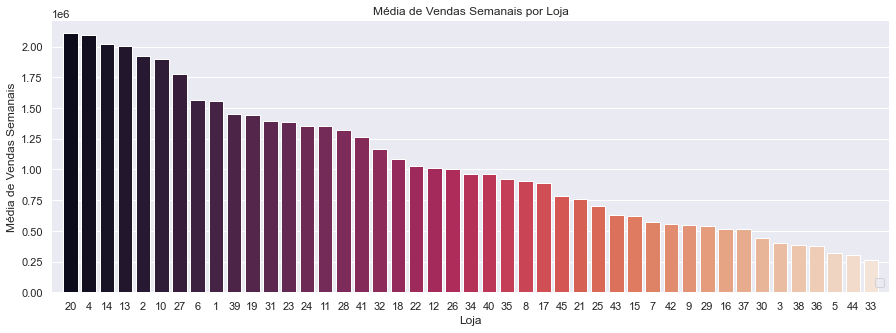

In [83]:
f, ax = plt.subplots(figsize=(15, 5))
sns.barplot(y="Weekly_Sales", x="Store", data=df_store, palette='rocket', order=df_store['Store'])


ax.legend(ncol=2, loc="lower right", frameon=True)
ax.set(xlim=(-1,45), ylabel="Média de Vendas Semanais", xlabel="Loja", title= "Média de Vendas Semanais por Loja")
sns.despine(left=True, bottom=True)

##Vendas Médias por Mês

Text(0.5, 1.0, 'Média de vendas por mês no período de 3 anos')

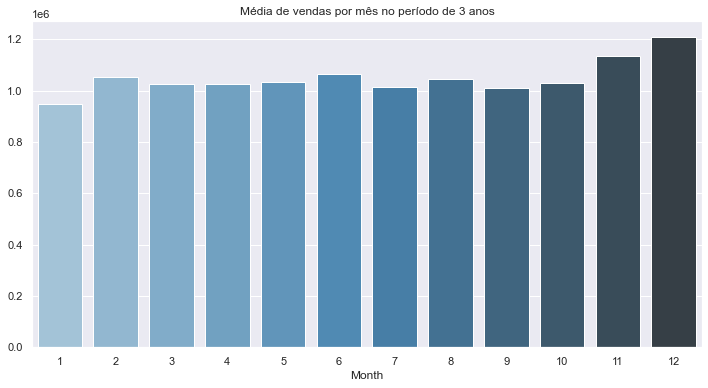

In [84]:
df_tmes = df_date.groupby('Month')['Weekly_Sales'].mean()
sns.set(rc = {'figure.figsize':(12,6)})
sns.barplot(x = df_tmes.index, y = df_tmes.values,palette='Blues_d').set_title('Média de vendas por mês no período de 3 anos')

##Box Plots

###Box Plot de Desemprego

In [85]:
fig = px.box(df['Unemployment'], width=400, height=600)
fig.update_layout(title_text='Box Plot de Desemprego', title_x=0.5, xaxis_title="", yaxis_title="Índice")
fig.show()

###Box Plot de Vendas Semanais

In [86]:
fig = px.box(df['Weekly_Sales'], title = 'Box Plot de Vendas Semanais', width=400, height=600)
fig.show()

Outliers podem ser justificados pelos ganhos elevados dos feriados.

###Box Plot de CPI

In [87]:
fig = px.box(df['CPI'], title = 'Box Plot de CPI', width=400, height=600)
fig.show()

###Box Plot do Combustível

In [88]:
fig = px.box(df['Fuel_Price'], title = 'Box Plot de Combustível', width=400, height=600)
fig.show()

###Box Plot de Temperatura

In [89]:
fig = px.box(df['Temperature'], title = 'Box Plot de Temperatura', width=400, height=600)
fig.show()

##Gráfico dos ganhos semanais em função do tempo, por loja.

Tabela interativa, com possibildiade de escolha do período e da loja desejada. 

In [90]:
df_graph_line = df.sort_values(['Date', 'Store'])

In [91]:
fig = px.line(df_graph_line, y="Weekly_Sales", x="Date", color='Store', title='Vendas Semanais por Loja por Tempo')
fig.show()

###Número de semanas no topo de vendas

In [92]:
df_top = df.loc[df.groupby(['Date'])['Weekly_Sales'].idxmax()]
df_top.sort_values(by=['Date'], ascending = True)


,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
2751,20,2010-01-10,1933719.21,0,61.08,2.707,204.885097,7.484
1867,14,2010-02-04,2495630.51,0,47.74,2.850,181.865754,8.899
1880,14,2010-02-07,2334788.42,0,76.61,2.815,182.318780,8.743
1861,14,2010-02-19,2204556.70,0,31.27,2.745,182.034782,8.992
1862,14,2010-02-26,2095591.63,0,34.89,2.754,182.077469,8.992
...,...,...,...,...,...,...,...,...
560,4,2012-10-08,2193367.69,0,83.21,3.476,130.756161,4.077
570,4,2012-10-19,2097266.85,0,64.46,3.610,131.149968,3.879
571,4,2012-10-26,2149594.46,0,63.64,3.514,131.193097,3.879
2835,20,2012-11-05,2168097.11,0,63.19,3.889,214.531910,7.139


In [93]:
df_top_ = df_top['Store'].value_counts()
df_top_


4     60
14    44
20    37
10     1
13     1
Name: Store, dtype: int64

Text(0, 0.5, 'Semanas Totais')

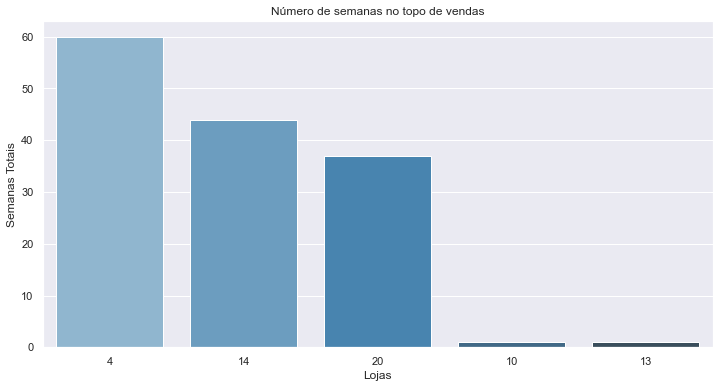

In [94]:
sns.set(rc = {'figure.figsize':(12,6)})
sns.barplot(x = df_top_.index, y = df_top_.values,palette='Blues_d', order=df_top_.index).set_title('Número de semanas no topo de vendas')
plt.xlabel("Lojas")
plt.ylabel("Semanas Totais")

##Desemprego em função do tempo

Cores representam as vendas semanais, quanto mais amarelo maior a venda semanal daquele ponto.

In [95]:
fig = px.scatter(df, x="Date", y="Unemployment", color="Weekly_Sales")
fig.show()

O gráfico nos mostra que há menos vendas semanais em pontos cujo índice de desempregro é elevado, entretando há poucos dados para relacionar tais índices.

###Gráfico radial das vendas semanais relacionadas com o desemprego

In [96]:
fig = px.scatter_polar(df, r="Unemployment", theta="Weekly_Sales", color="Weekly_Sales", title='Vendas Semanais e Desemprego',  width=1000, height=800, color_discrete_sequence=px.colors.sequential.Plasma_r)
fig.show()

O gráfico, embora normalmente utilizado para plots geograficos, reforça a conclusão anterior. O índice de desemprego, quando elevado, afeta os ganhos semanais. Entretanto, baixos índices de desemprego não são garantias ou indicadores de ganhos semanais!

##Violinos

###Violino do Desemprego por Loja

In [97]:
fig = px.violin(df, y="Unemployment", x="Store", color="Store", box=True, points="all", hover_data=df.columns)
fig.show()

Não parecem haver outliers significativos ou dados com grande desvio (*deviance*)

###Violino das Vendas Semanais por Loja

In [98]:
fig = px.violin(df, y="Weekly_Sales", x="Store", color="Store", box=True, points="all", hover_data=df.columns)
fig.show()

Não parecem haver outliers significativos ou dados com grande desvio (*deviance*)

###Violino de CPI por loja

In [99]:
fig = px.violin(df, y="CPI", x="Store", color="Store", box=True, points="all", hover_data=df.columns)
fig.show()

Interessante observar que as variações são pequenas e que, provavelmente, não serão relevantes para a tomada de decisão final. 

#Análise dos dados

##Análise correlacional

In [100]:
df.corr()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,1.000000e+00,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531
Weekly_Sales,-3.353320e-01,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,-4.386841e-16,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-2.265908e-02,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158
Fuel_Price,6.002295e-02,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684
CPI,-2.094919e-01,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020
Unemployment,2.235313e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000


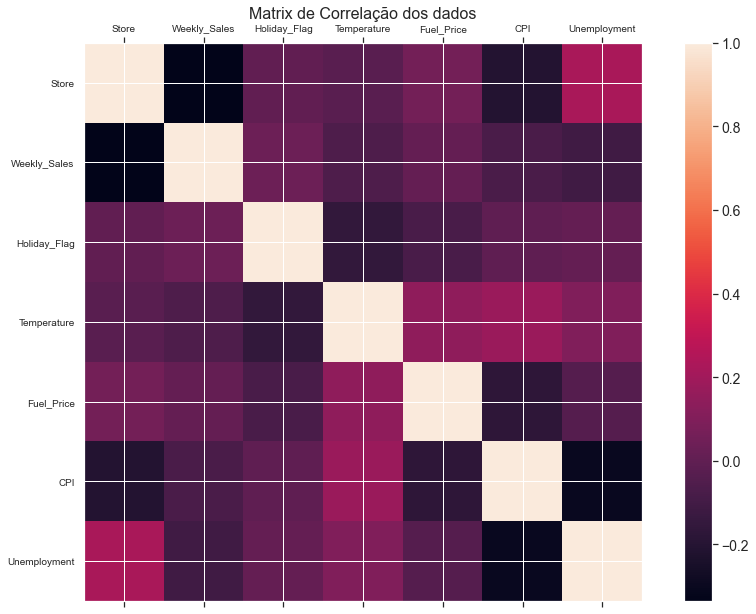

In [101]:
f = plt.figure(figsize=(15, 10))
plt.matshow(df.corr(), fignum=f.number)
plt.xticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns, fontsize=10, rotation=0)
plt.yticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns, fontsize=10)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Matrix de Correlação dos dados', fontsize=16);

Não há correlação significativa entre os dados.

##Índice de Crescimento no Período

###Índice de Crescimento de Totas as Lojas

In [102]:
fig = px.scatter(df_graph_line, x="Date", y="Weekly_Sales", color="Store", trendline="ols", title='Índice de Crescimento de Todas as Lojas')
fig.update_traces(visible=False, selector=dict(mode="markers"))
fig.show()

Num geral, as lojas cresceram dentro do período avaliado

###Gráfico do Índice de Crescimento para o período por loja

O crescimento (positivo ou negativo) pode ser visualizado através da linha de regressão linear simples.

In [103]:
df_scatter = df[:]
df_scatter['Store'] = df_scatter['Store'].astype('object')
df_scatter.sort_values(by='Store', ascending=True, inplace=True)

In [104]:
fig = px.scatter(df_scatter, y="Weekly_Sales", x="Date", trendline="ols", color='Store', trendline_scope = 'trace', title='Índice de Crescimento por Loja (Linha de Tendência)')
# fig.update_traces(visible=False, selector=dict(mode="markers"))

fig.show()

###Análise da Linha de Regressão Linear

In [105]:
results = px.get_trendline_results(fig)
results = results.iloc[38]["px_fit_results"].summary()
print(results)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.006
Method:                 Least Squares   F-statistic:                    0.2174
Date:                Sun, 03 Apr 2022   Prob (F-statistic):              0.642
Time:                        17:02:22   Log-Likelihood:                -1959.7
No. Observations:                 143   AIC:                             3923.
Df Residuals:                     141   BIC:                             3929.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        1.45e+06   1.83e+04     79.460      0.0

In [106]:
results = px.get_trendline_results(fig)
results = results.iloc[1]["px_fit_results"]
dir(results)

['HC0_se',
 'HC1_se',
 'HC2_se',
 'HC3_se',
 '_HCCM',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abat_diagonal',
 '_cache',
 '_data_attr',
 '_data_in_cache',
 '_get_robustcov_results',
 '_is_nested',
 '_use_t',
 '_wexog_singular_values',
 'aic',
 'bic',
 'bse',
 'centered_tss',
 'compare_f_test',
 'compare_lm_test',
 'compare_lr_test',
 'condition_number',
 'conf_int',
 'conf_int_el',
 'cov_HC0',
 'cov_HC1',
 'cov_HC2',
 'cov_HC3',
 'cov_kwds',
 'cov_params',
 'cov_type',
 'df_model',
 'df_resid',
 'eigenvals',
 'el_test',
 'ess',
 'f_pvalue',
 'f_test',
 'fittedvalues',
 'fvalue',
 'get_influence',
 'get_prediction',
 'get_robustcov_results',
 'initialize',
 'k

'params' trará nosso coeficiente Beta

In [107]:
df_coef = px.get_trendline_results(fig)
dic_temp = {}

for i in range(0,45):
  df_coef_temp = df_coef.iloc[i]["px_fit_results"]
  dic_temp[i] = df_coef_temp.params

In [108]:
df_temp = pd.DataFrame.from_dict(dic_temp, orient='index')
del df_temp[0]
df_temp['Beta'] = df_temp[1]
del df_temp[1]

In [109]:
df_temp['Store'] = df_temp.index+1

In [110]:
df_temp_sort = df_temp.sort_values(by='Beta', ascending = False)

In [111]:
df_temp_sort.head()

,Beta,Store
22,27594.700382,23
26,22211.366149,27
34,20254.729643,35
23,20148.958077,24
18,18177.981829,19


####Gráfico em barra do Índice de Crescimento pelo Tempo por loja

No handles with labels found to put in legend.


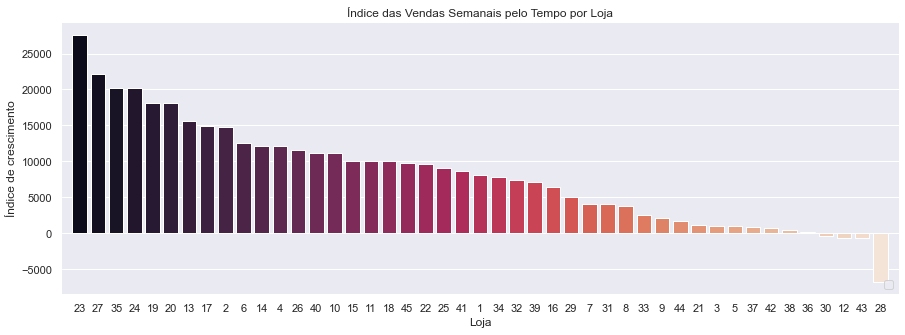

In [112]:
f, ax = plt.subplots(figsize=(15, 5))
sns.barplot(y="Beta", x="Store", data=df_temp_sort, palette='rocket', order=df_temp_sort['Store'])

ax.legend(ncol=2, loc="lower right", frameon=True)
ax.set(xlim=(-1,45), ylabel="Índice de crescimento", xlabel="Loja", title= "Índice das Vendas Semanais pelo Tempo por Loja")
sns.despine(left=True, bottom=True)

As lojas 39 e 4 são as que mais cresceram (em vendas semanais) no período. 

#Comparação da Loja 39 com a 4

Vamos comparar a loja 4 com a 39, pois são as com maiores indices de crescimento

##Ganhos semanais em função do tempo das lojas 39 e 4

In [113]:
df_39_4 = df.loc[(df['Store'] == 39) | (df['Store'] == 4)]
df_39_4.sort_values(by='Date', inplace=True)

C:\Users\helde\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [114]:
fig = px.line(df_39_4, y="Weekly_Sales", x="Date", color="Store", title='Vendas Semanais das Lojas 39 e 4')
fig.show()

##Média das Vendas das lojas 39 e 4

In [115]:
df_39_4_mean = df_39_4.groupby(['Store']).mean()

Text(0.5, 1.0, 'Média de vendas das lojas 4 e 39')

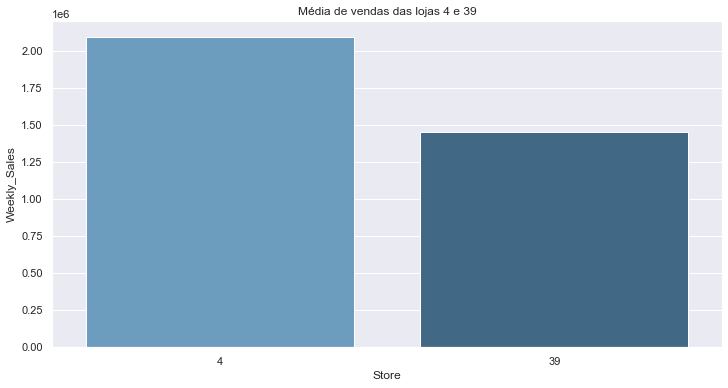

In [116]:
sns.set(rc = {'figure.figsize':(12,6)})
sns.barplot(x = df_39_4_mean.index, y = df_39_4_mean['Weekly_Sales'],palette='Blues_d').set_title('Média de vendas das lojas 4 e 39')

In [117]:
df_39_4_mean

,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,,,,,,
4,2.094713e+06,0.06993,62.253357,3.216972,128.679669,5.964692
39,1.450668e+06,0.06993,70.597343,3.219699,214.729069,7.869049


##Vendas Totais das Lojas 39 e 4

In [118]:
df_39_4_sum = df_39_4.groupby(['Store']).sum()

Text(0.5, 1.0, 'Vendas Totais das lojas 4 e 39')

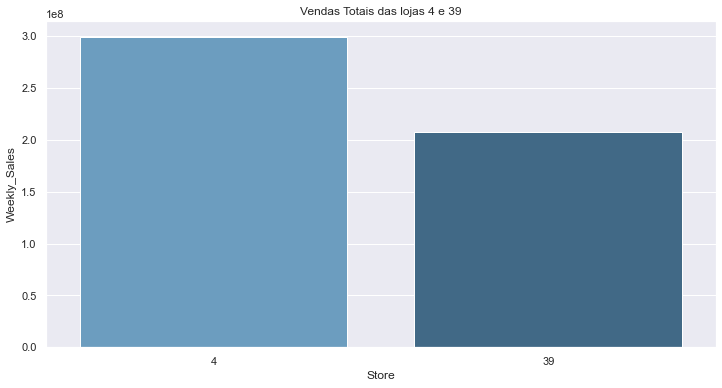

In [119]:
sns.set(rc = {'figure.figsize':(12,6)})
sns.barplot(x = df_39_4_sum.index, y = df_39_4_sum['Weekly_Sales'],palette='Blues_d').set_title('Vendas Totais das lojas 4 e 39')

Observa-se que a loja 4 possui ganhos semanais muito maiores que a 39 (quase 30% há mais).

##Trendline da loja 39

In [149]:
df_39 = df.loc[(df['Store'] == 39)]
df_39.sort_values(by='Date', inplace=True)

In [121]:
fig_39 = px.scatter(df_39, y="Weekly_Sales", x="Date", trendline="ols", title='Crescimento da loja 39',trendline_color_override="red")
fig_39.show()

Outliers podem ser explicados pelos dias festivos

##Trendline da loja 4

In [122]:
df_4 = df.loc[(df['Store'] == 4)]
df_4.sort_values(by='Date', inplace=True)

In [123]:
fig_4 = px.scatter(df_4, y="Weekly_Sales", x="Date", trendline="ols", title='Crescimento da loja 4',trendline_color_override="red")
fig_4.show()

Outliers podem ser explicados pelos dias festivos

##Violinos da 39

###Violino de Desemprego

In [124]:
fig = px.violin(df_39, y="Unemployment", x="Store", color="Store", box=True, points="all", hover_data=df.columns, title='Violino de Desemprego da 39')
fig.show()

###Violino de Vendas Semanais da 39

In [125]:
fig = px.violin(df_39, y="Weekly_Sales", x="Store", color="Store", box=True, points="all", hover_data=df.columns, title='Violino de Vendas Semanais da 39')
fig.show()

Outliners explicados pelas datas festivas

##Violinos da 4

###Violino de Desemprego da 4

In [126]:
fig = px.violin(df_4, y="Unemployment", x="Store", color="Store", box=True, points="all", hover_data=df.columns, title='Violino de Desemprego da 4')
fig.show()

###Violino de Vendas Semanais da 4

In [127]:
fig = px.violin(df_4, y="Weekly_Sales", x="Store", color="Store", box=True, points="all", hover_data=df.columns, title='Violino de Vendas Semanais da 4')
fig.show()

##Comparação entre os índices de crescimento (Beta) das lojas 39 e 4

In [128]:
df_conc = df_temp_sort.loc[(df_temp_sort['Store'] == 4)|(df_temp_sort['Store'] == 39)]
df_conc

,Beta,Store
3,12083.257107,4
38,7088.121468,39


Text(0.5, 1.0, 'índice de Crescimento das Lojas 4 e 39')

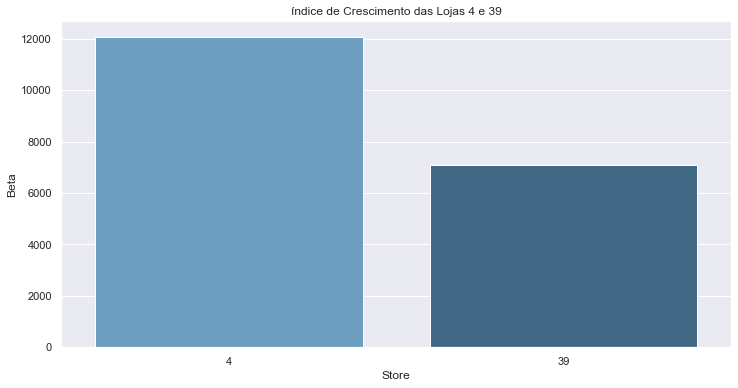

In [129]:
sns.set(rc = {'figure.figsize':(12,6)})
sns.barplot(x = df_conc['Store'], y = df_conc['Beta'],palette='Blues_d').set_title('índice de Crescimento das Lojas 4 e 39')

###Variação do Desemprego das lojas 39 e 4

In [130]:
fig_6 = px.scatter(df_4, y="Unemployment", x="Date", trendline="lowess", title='Desemprego da loja 4 pelo tempo',trendline_color_override="red")
fig_6.show()

In [131]:
fig_6 = px.scatter(df_39, y="Unemployment", x="Date", trendline="lowess", title='Desemprego da loja 39 pelo tempo',trendline_color_override="red")
fig_6.show()

Podemos observar que a loja 4 está com índice menor de desemprego e que a mesma possui queda com comportamento quase linear. A 39 se mostra em queda ao final do período, mas seu índice é superior a da 4

##As lojas 39 e 4 quando comparada a média global

In [132]:
df_39 = df.loc[(df['Store'] == 39)]
df_39.sort_values(by='Date', inplace=True)

C:\Users\helde\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [133]:
df_4 = df.loc[(df['Store'] == 4)]
df_4.sort_values(by='Date', inplace=True)

In [134]:
df_mean2 = df[:]
df_mean2 = df_mean2.groupby(['Date'], as_index=False).mean()
df_mean2.sort_values(by=['Date'], ascending = True)
df_mean2['Store'] = "Média"

In [135]:
df_mean3 = pd.concat([df_39, df_4, df_mean2], ignore_index=True, sort=False)
df_mean3.sort_values(by=['Date'], ascending = True)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,39,2010-01-10,1.219584e+06,0.0,72.740000,2.603000,210.440443,8.476000
286,Média,2010-01-10,9.386639e+05,0.0,69.868000,2.734333,168.354706,8.475289
143,4,2010-01-10,1.842821e+06,0.0,63.960000,2.619000,126.234600,7.127000
1,39,2010-02-04,1.463943e+06,0.0,63.310000,2.719000,209.593866,8.464000
287,Média,2010-02-04,1.120530e+06,0.0,53.120889,2.827333,167.789036,8.497711
...,...,...,...,...,...,...,...,...
284,4,2012-11-05,2.127661e+06,0.0,67.640000,3.685000,131.145333,4.308000
141,39,2012-11-05,1.470792e+06,0.0,75.520000,3.688000,220.407558,6.989000
285,4,2012-12-10,2.133026e+06,0.0,57.110000,3.603000,131.108333,3.879000
142,39,2012-12-10,1.494417e+06,0.0,69.880000,3.601000,222.051079,6.228000


In [136]:
fig = px.line(df_mean3, y="Weekly_Sales", x="Date", color='Store', title='Vendas Semanais das lojas 39 e 4 vs. Média')
fig.show()

#Conclusão

A loja 4 parece ser a ideial para a realização de investimentos no momento. 

* A loja já possui grande retorno semanal, quando comparada às demais.
* A loja possui grande retorno nas datas festivas.
* O crescimento da loja foi expressivo, quando comparada às demais. 
* É a loja com maior crescimento.